In [1]:
import gym
import math
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt

import numpy as np
from torch.autograd import Variable # torch 中 Variable 模块
%matplotlib inline

In [2]:
# https://zhuanlan.zhihu.com/p/29032608
# Hyper Parameters
epsi_high = 0.9,
epsi_low = 0.05,
decay = 200, 

BATCH_SIZE = 64
LR = 0.001                   # learning rate
EPSILON = 0.9               # greedy policy
GAMMA = 0.8                 # reward discount
TARGET_REPLACE_ITER = 100   # target update frequency
TARGET_REPLACE_ITER = 1   # target update frequency
MEMORY_CAPACITY = 1000
env = gym.make('CartPole-v0')
env = env.unwrapped
N_ACTIONS = env.action_space.n
N_STATES = env.observation_space.shape[0]

WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.


In [3]:
class Net(nn.Module):
    def __init__(self, ):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(N_STATES, 256)     # class torch.nn.Linear(in_features, out_features, bias=True)
#         self.fc1.weight.data.normal_(0, 0.1)   # initialization
        self.out = nn.Linear(256, N_ACTIONS)
#         self.out.weight.data.normal_(0, 0.1)   # initialization

    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)
        actions_value = self.out(x)
        return actions_value

In [4]:
class DQN(object):
    def __init__(self):
        self.eval_net, self.target_net = Net(), Net()

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
        self.loss_func = nn.MSELoss()
        self.steps = 0

    def choose_action(self, x):
        #torch.max(input, dim, keepdim=False, out=None) -> (Tensor, LongTensor)
        
        self.steps += 1
        epsi = epsi_low[0] + (epsi_high[0] - epsi_low[0]) * (math.exp((-1.0) * self.steps/decay[0]))
        if random.random() < epsi:
            a0 = random.randrange(N_ACTIONS)
        else:
            s0 =  torch.tensor(x, dtype=torch.float).view(1,-1)
            a0 = torch.argmax(self.eval_net(s0)).item()
        return a0

    def store_transition(self, s, a, r, s_):
        #set s,a,r,s_ the arrary of 1*N
        transition = np.hstack((s, [a, r], s_))
        #another type of the hstack , the result is the same
        another_result = np.hstack((s,a,r,s_))
        # use % can loop from 0 to 2000
        index = self.memory_counter % MEMORY_CAPACITY
        #save the info_this_step into memory
        self.memory[index, :] = transition
        self.memory_counter += 1

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
        self.learn_step_counter += 1

        # by random , choose the row's number from memory_capacity , total row's number is batch_size(32)
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]

        # in the memory, the 1st---4th column is state_now , the 5th is action , the 6th is reward
        # the final 4 column is state_next
        b_s = Variable(torch.FloatTensor(b_memory[:, :N_STATES]))
        b_a = Variable(torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int)))
        b_r = Variable(torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2]))
        b_s_ = Variable(torch.FloatTensor(b_memory[:, -N_STATES:]))

        # q_eval w.r.t the action in experience
        q_eval = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)

        q_eval_test= self.eval_net(b_s)
        #argmax axis = 0 means column , 1 means row
        #we choose the max acion value , the action is column , so axis = 1
        #select max Q的action
        Q1_argmax = np.argmax(q_eval_test.data.numpy(),axis = 1)

        q_next = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
#         q_next = self.target_net(b_s_)

        #evaluate 之前action的Q值  可能并不是最大的值
        q_next_numpy = q_next.data.numpy()
        q_update = np.zeros((BATCH_SIZE,1))
        for iii in range(64):
            q_update[iii] = q_next_numpy[iii , Q1_argmax[iii]]

        q_update = GAMMA * q_update
        q_update = torch.FloatTensor(q_update)
        
        variable11 = Variable(q_update)
        q_target = b_r + variable11
        #q_target = b_r + GAMMA * q_next.max(1)[0]   # shape (batch, 1)
        loss = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        
    def plot(self, score, mean):
        from IPython import display
        display.clear_output(wait=True)
        display.display(plt.gcf())
        plt.figure(figsize=(20,10))
        plt.clf()
    
        plt.title('Training...')
        plt.xlabel('Episode')
        plt.ylabel('Duration')
        plt.plot(score)
        plt.plot(mean)
        plt.text(len(score)-1, score[-1], str(score[-1]))
        plt.text(len(mean)-1, mean[-1], str(mean[-1]))

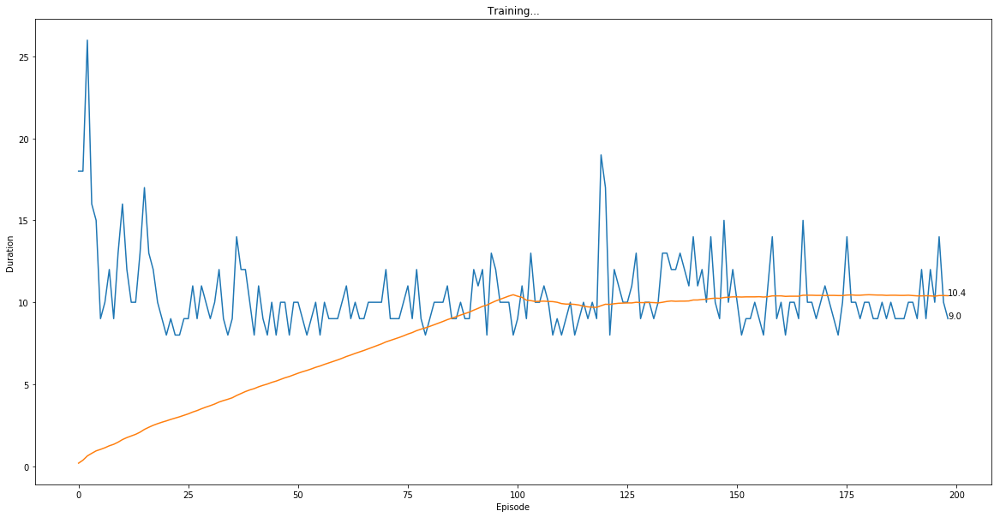

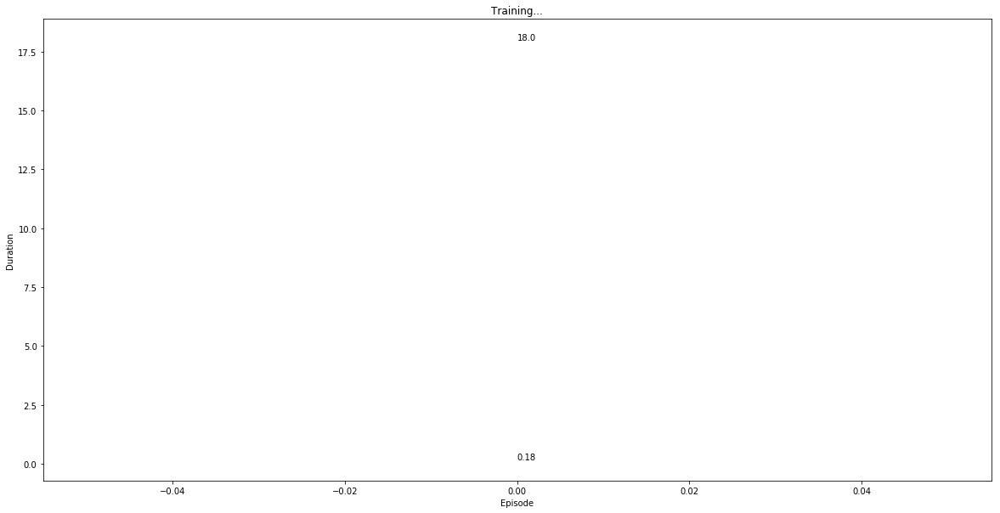

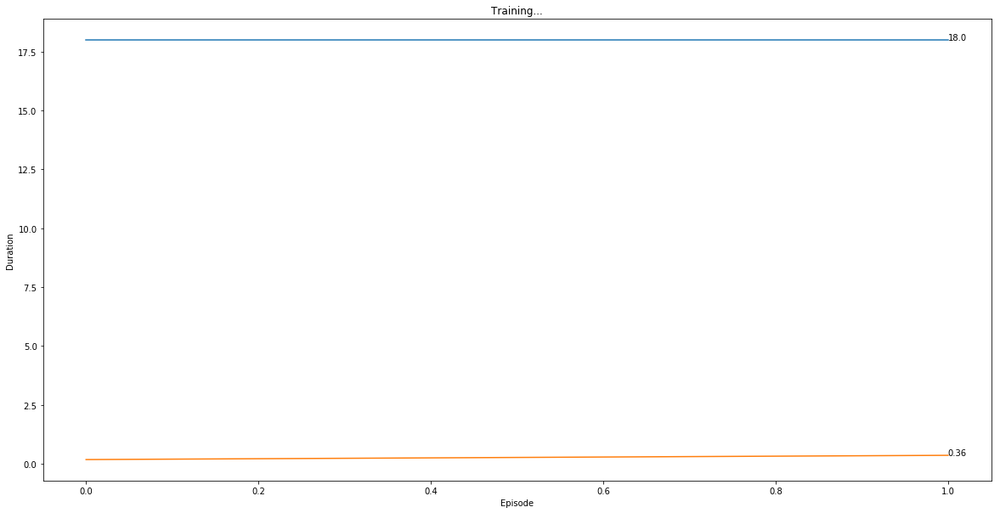

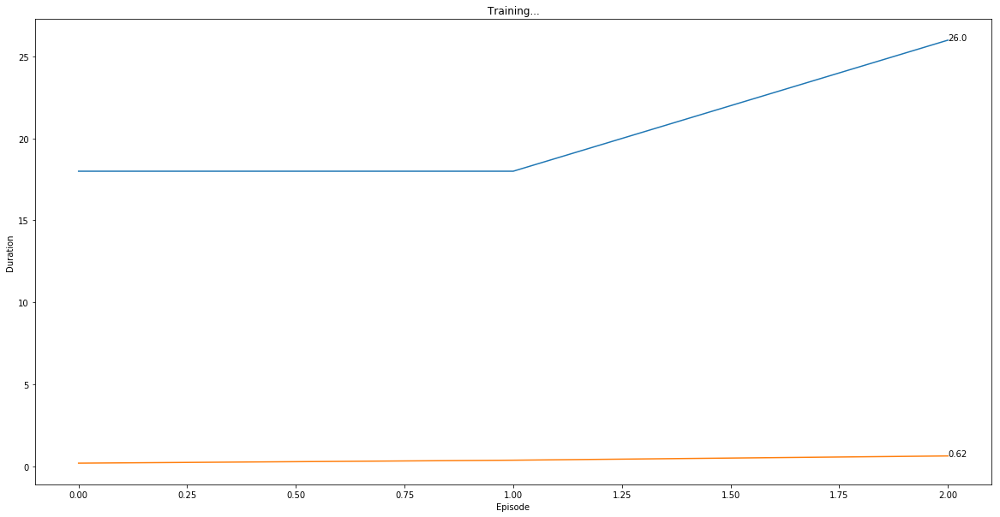

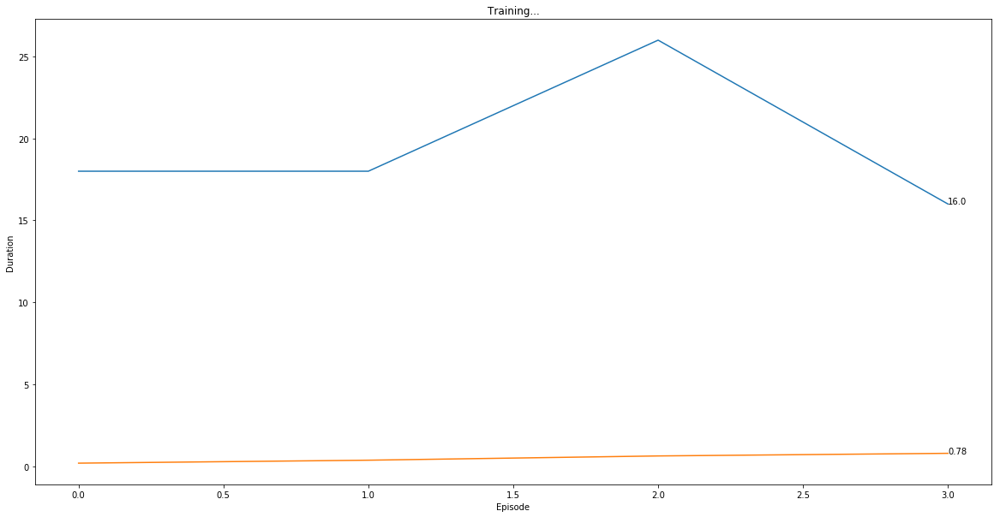

...

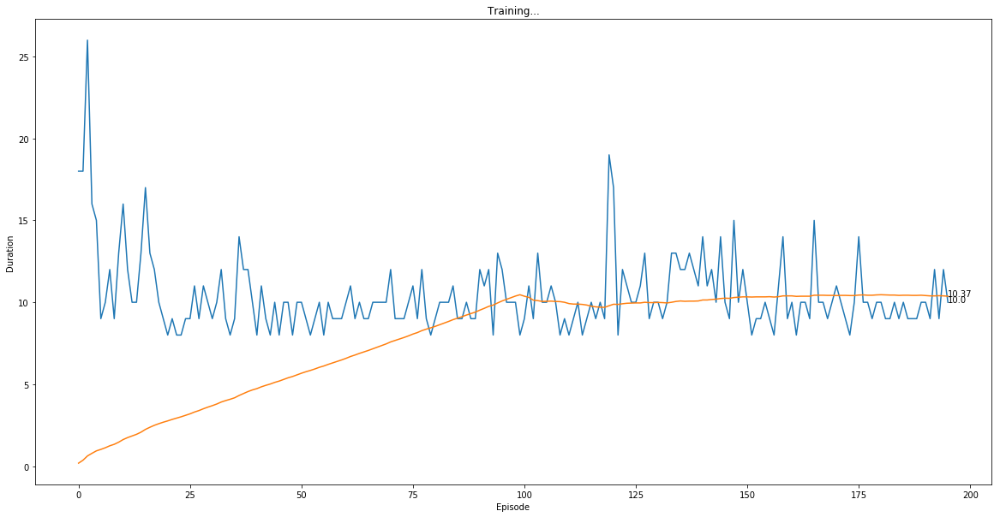

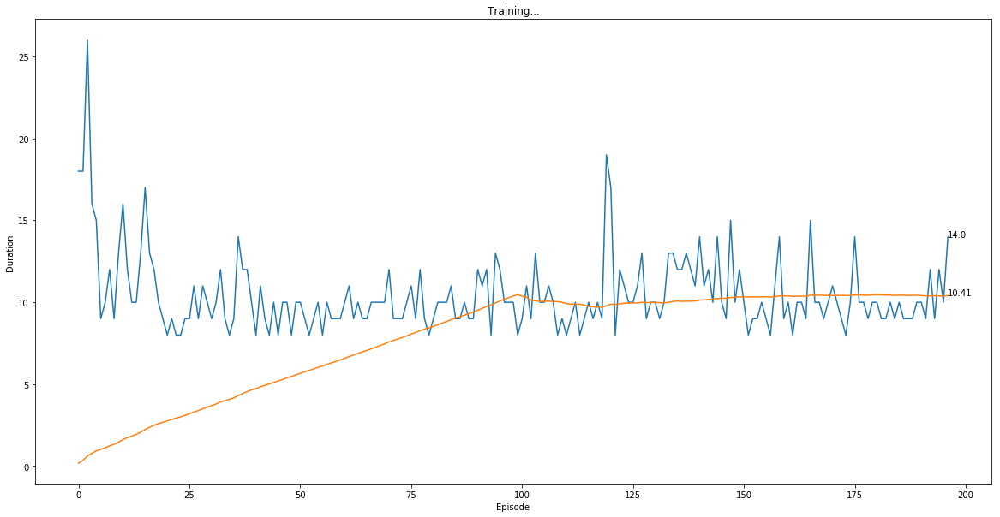

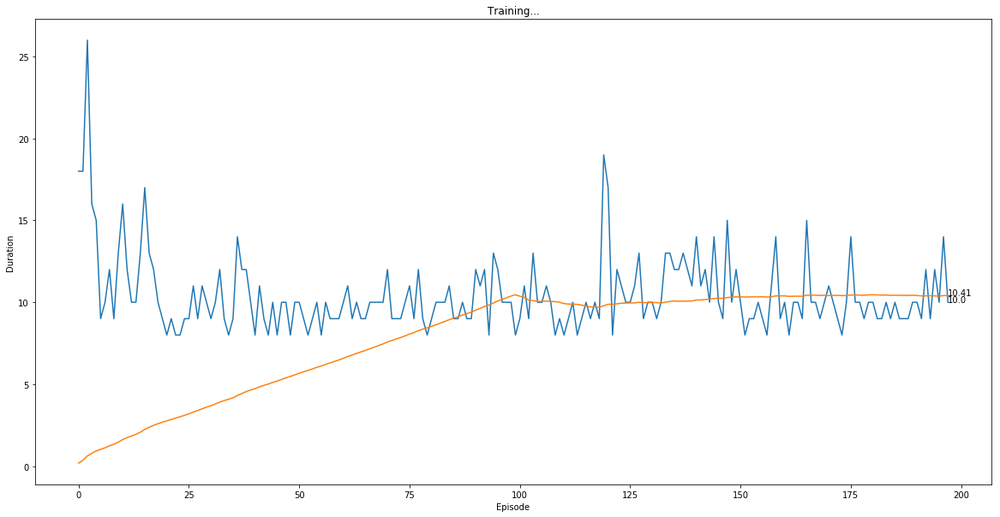

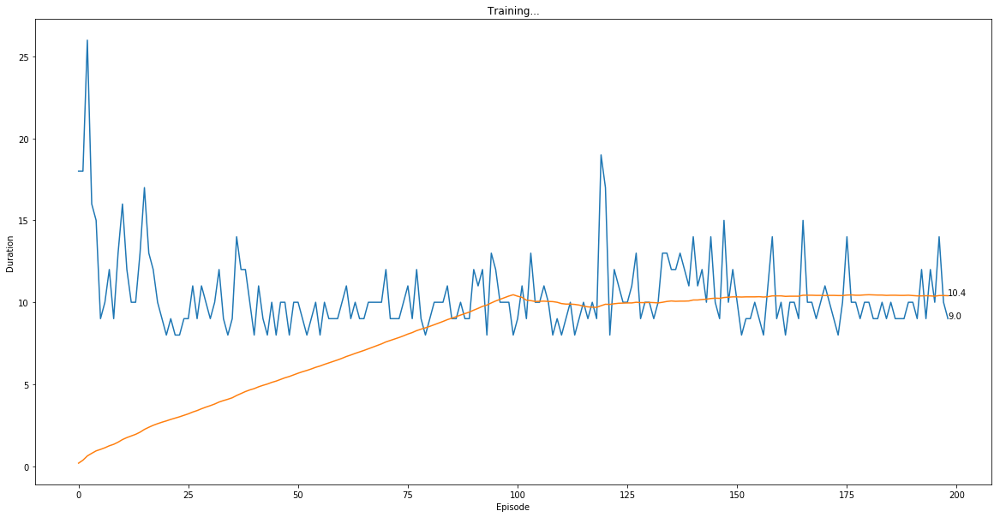

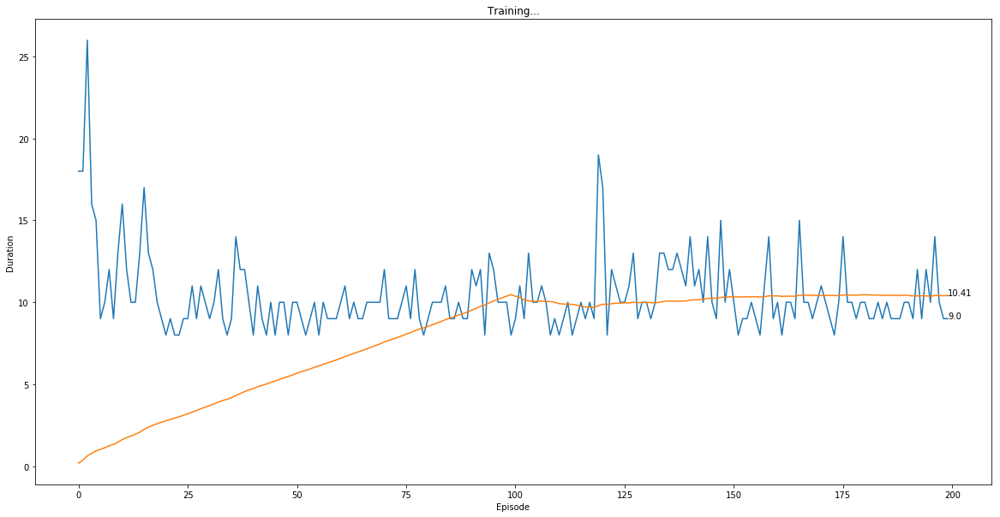

In [5]:
dqn = DQN()
score = []
mean = []
print("\nCollecting experience...")

for i_episode in range(200):
    total_reward = 1
    observation = env.reset()
    while True:
        #render environment
        env.render()
        #choose action
        action = dqn.choose_action(observation)
        # take action
        obeservation_, reward, done, info= env.step(action)
        #store data
        dqn.store_transition(observation, action, reward, obeservation_)
        #data is enough then do the RL

        if done:
            reward = -1
        if done:
            break
        
        total_reward += reward
        
#         if dqn.memory_counter > MEMORY_CAPACITY:
#             dqn.learn()
        dqn.learn()
    
        #state update
        observation = obeservation_

    score.append(total_reward)
    mean.append( sum(score[-100:])/100)
    dqn.plot(score, mean)

In [6]:
# python全局变量按照 tuple存储  使用[0]to float
print(type(epsi_high))
print (epsi_high)
print (epsi_high[0])
print(type(epsi_high[0]))

<class 'tuple'>
(0.9,)
0.9
<class 'float'>


In [7]:
# variable 和  detach  和 gather 的torch用法  要学会